In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from sklearn.preprocessing import MultiLabelBinarizer
from datetime import datetime

import glob
import os

In [2]:
path_central_novice = './CentralR-N'
all_files_central_novice = sorted(glob.glob(os.path.join(path_central_novice, "*.json")))

central = []
for f in all_files_central_novice:
    df = pd.read_json(f)
    df['logDate'] = f[25:35]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    central.append(df)
    
central_novice = pd.concat(central, ignore_index=True)
central_novice['region'] = 'Central'

path_east_novice = './EastR-N'
all_files_east_novice = sorted(glob.glob(os.path.join(path_east_novice, "*.json")))

east = []
for f in all_files_east_novice:
    df = pd.read_json(f)
    df['logDate'] = f[22:32]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    east.append(df)
    
east_novice = pd.concat(east, ignore_index=True)
east_novice['region'] = 'East'

novice = pd.concat(([central_novice, east_novice]), ignore_index=True)
X = novice.drop(['annId', 'urls', 'siteIds', 'animeScore', 'selfAnswer', 'fromList', 'gameMode', 'correct'], axis=1).copy()

def find_n_correct(players):
    i = 0
    for player in players:
        if player['correct'] == True:
            i += 1
    return i

def find_gt(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x]
    return np.array(guess_times).mean()

def find_gt_filter(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x and x['guessTime'] < 15000]
    return np.array(guess_times).mean()

def find_ng(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_ng_filter(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x and x['guessTime'] < 15000:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_cgt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == True)])
    return np.array(guess_times).mean()

def find_igt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == False)])
    return np.array(guess_times).mean()

def find_scores(players):
    scores = np.zeros(len(players))
    for i, x in enumerate(players):
        scores[i] = x['score']
    return scores

def shortest_answer_length(answers):
    return len(min(answers, key=len))

X['avgGuessTime'] = X['players'].apply(find_gt)
X['avgGuessTime_15k'] = X['players'].apply(find_gt_filter)
X['n_correctGuess'] = X['players'].apply(find_n_correct)
X['n_noGuess'] = X['players'].apply(find_ng)
X['n_noGuess_15k'] = X['players'].apply(find_ng_filter)
X['p_noGuess'] = X['n_noGuess']/X['activePlayers'] *100
X['p_noGuess_15k'] = X['n_noGuess_15k']/X['activePlayers'] *100
X['p_correctGuess'] = X['n_correctGuess']/X['activePlayers']*100
X['avgGuessTime_c'] = X['players'].apply(find_cgt)
X['avgGuessTime_i'] = X['players'].apply(find_igt)
X['type_noNumber'] = X['type'].str.split().str[0]
X['samplePercent'] = X['startSample']/X['videoLength']
X['AiredDate'] = X['vintage'].replace({'Winter': '1', 'Spring': '4', 'Summer': '7', 'Fall': '10'}, regex=True)
X['AiredDate'] = pd.to_datetime(X['AiredDate'], format='%m %Y')
X['shortest_length'] = X['altAnswers'].apply(shortest_answer_length)

n_games = X.shape[0]/45
songs_played = X.shape[0]
guess_rate = X['p_correctGuess'].mean()
guess_time = X['avgGuessTime'].mean()
no_guess_rate = X['p_noGuess'].mean()
diff = X['difficulty'].mean()

op = X.loc[X['type_noNumber'] == 'Opening']
op_played = op.shape[0]
op_rate = op['p_correctGuess'].mean()
op_diff = op['difficulty'].mean()

ed = X.loc[X['type_noNumber'] == 'Ending']
ed_played = ed.shape[0]
ed_rate = ed['p_correctGuess'].mean()
ed_diff = ed['difficulty'].mean()

ins = X.loc[X['type_noNumber'] == 'Insert']
in_played = ins.shape[0]
in_rate = ins['p_correctGuess'].mean()
in_diff = ins['difficulty'].mean()

last_song = pd.DataFrame(X.loc[X['songNumber'] == 45]).reset_index(drop=True)
last_song['Scores'] = last_song['players'].apply(find_scores)

finalScores = np.concatenate(last_song['Scores'].values).astype(int)
end_mean = finalScores.mean()
end_std = finalScores.std()
end_max = finalScores.max()

mlb = MultiLabelBinarizer()
s = X['tags']
dummy = pd.DataFrame(mlb.fit_transform(s), columns=mlb.classes_, index=X.index)
X = pd.concat([X, dummy], axis=1)

mlb2 = MultiLabelBinarizer()
s = X['genre']
dummy = pd.DataFrame(mlb2.fit_transform(s), columns=mlb2.classes_, index=X.index)
X = pd.concat([X, dummy], axis=1)

X = X.drop(['tags', 'genre'], axis=1)

genres = X[mlb2.classes_].sum().sort_values(ascending=False)
g_perc = pd.Series(index=mlb2.classes_, dtype='float64')
for genre in mlb2.classes_:
    g_perc[genre] = X.loc[X[genre] == 1]['p_correctGuess'].mean()
genres = pd.concat([genres, g_perc], axis=1)
genres.columns = ['Count', 'Guess rate']
genres = genres.sort_values(by='Guess rate', ascending=False)

tags = X[mlb.classes_].sum().sort_values(ascending=False)
t_perc = pd.Series(index=mlb.classes_, dtype='float64')
for tag in mlb.classes_:
    t_perc[tag] = X.loc[X[tag] == 1]['p_correctGuess'].mean()
tags = pd.concat([tags, t_perc], axis=1)
tags.columns = ['Count', 'Guess rate']
tags = tags.sort_values(by='Count', ascending=False).head(30).sort_values(by='Guess rate', ascending=False)

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1415/1561509818.py:75: RuntimeWarning: Mean of empty slice.
  return np.array(guess_times).mean()
/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1415/1561509818.py:79: RuntimeWarning: Mean of empty slice.
  return np.array(guess_times).mean()


In [ ]:
general_table = [
    ['Games played', n_games],
    ['Songs played', songs_played],
    ['Correct guess rate (%)', '{:.2f}'.format(guess_rate)],
    ['Average difficulty', '{:.2f}'.format(diff)],
    ['Average guess time (s)', '{:.2f}'.format(guess_time/1000)],
    ['No guess rate (%)', '{:.2f}'.format(no_guess_rate)]
]
print(tabulate(general_table, tablefmt='fancy_grid'))

types_table = {
    'Openings': [op_played, op_rate, op_diff],
    'Endings': [ed_played, ed_rate, ed_diff],
    'Inserts': [in_played, in_rate, in_diff]
}
print(tabulate(types_table, tablefmt='fancy_grid', headers='keys', showindex=[
    'Songs played', 'Correct guess rate (%)', 'Average difficulty']
              ))

ends_table = {
    'Final score': ['{:.2f}'.format(end_mean), '{:.2f}'.format(end_std), end_max]
}
print(tabulate(ends_table, tablefmt='fancy_grid', headers='keys', showindex=[
    'Mean', 'STD', 'Highest']
              ))

In [ ]:
f, ax = plt.subplots(2, 1, sharex=True)
sns.histplot(X['avgGuessTime_c'], ax=ax[0], bins=30, stat='percent', label='Correct')
sns.histplot(X['avgGuessTime_i'], ax=ax[0], bins=30, stat='percent', label='Incorrect')
sns.scatterplot(X, y='p_correctGuess', x='avgGuessTime', hue='p_noGuess', ax=ax[1])
ax[1].set_xlabel('Average guess time')
ax[1].set_ylabel('Percent of correct guesses')
ax[0].legend()
ax[1].legend(title='No guesses (%)', labels=['0', '15', '30', '45', '60'])
f.tight_layout()
plt.show()

f, ax = plt.subplots(1, 1)
sns.scatterplot(X, x='difficulty', y='p_correctGuess', ax=ax, hue='p_noGuess')
ax.legend(title='No guesses (%)', labels=['0', '15', '30', '45', '60'])
ax.set_xlabel('Difficulty')
ax.set_ylabel('Percent of correct guesses')
ax.set_xlim(0, 100)
ax.set_ylim(0, 100)
plt.show()

f, ax = plt.subplots(1, 1)
sns.histplot(finalScores, discrete=True, ax=ax, color='red')
ax.set_xlabel('Final Scores')
plt.show()

f, ax = plt.subplots(2, 1, sharex=False)
sns.histplot(X['samplePercent']*100, ax=ax[0], color='green')
ax[0].set_xlabel('Sample percent')
seconds = X['samplePercent']*10
sns.violinplot(X, x=seconds.apply(np.floor)*10, y='p_correctGuess', ax=ax[1])
ax[1].set_xlabel('Sample percent')
ax[1].set_ylabel('Correct percent')
f.tight_layout()
plt.show()

f, ax = plt.subplots(1, 1)
sns.histplot(X['AiredDate'], ax=ax, color='pink')
ax.set_xlabel('Aired Date')
plt.show()

f, ax = plt.subplots(2, 1, sharex=True)
decade = X['AiredDate'].dt.year//10*10 
sns.violinplot(X, x=decade, y='p_correctGuess', ax=ax[0])
sns.violinplot(X, x=decade, y='avgGuessTime', ax=ax[1])
ax[0].set_xlabel('')
ax[1].set_xlabel('Aired Date')
ax[0].set_ylabel('Correct Percent')
ax[1].set_ylabel('Guess Time')
f.tight_layout()
plt.show()

In [3]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

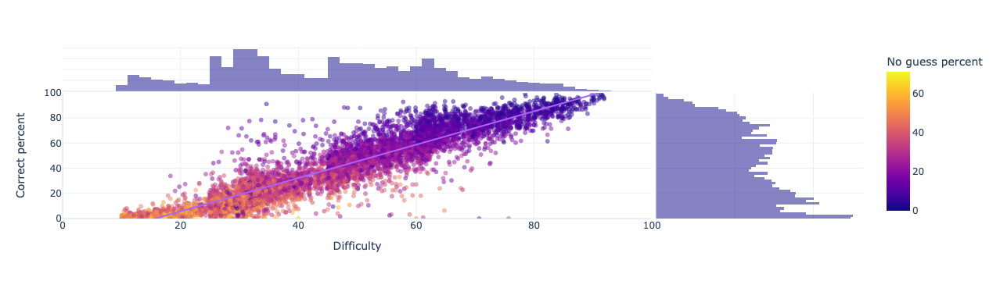

In [4]:
def find_jp(names):
    if 'romaji' in names:
        name = names['romaji']
    else:
        raise Exception('No jp name')
    return name
X['anime_jp'] = X['anime'].apply(find_jp)

lbs = {'difficulty':'Difficulty',
      'artist':'Artist',
      'name':'Song',
      'p_correctGuess':'Correct percent',
      'p_noGuess':'No guess percent',
      'anime_jp':'Anime',
      'avgGuessTime':'Average guess time',
      'AiredDate': 'Aired date',
      'avgGuessTime_c':'Correct avg. guess time',
      'avgGuessTime_i':'Incorrect avg. guess time',
      'type_noNumber':'Song type'}

hover_dt = {'artist':True,
           'name':True,
           'anime_jp':True,
           'avgGuessTime':True,
           'difficulty':':.1f',
           'p_noGuess':':.1f',
           'p_correctGuess':':.1f',
           'avgGuessTime':':.1f',
           'avgGuessTime_c':':.1f',
           'avgGuessTime_i':':.1f',}
px.scatter(
        X,
        x='difficulty',
        y='p_correctGuess',
        color='p_noGuess', 
        marginal_x='histogram', 
        marginal_y='histogram',
        hover_data=hover_dt,
        labels=lbs,
        trendline='ols',
        template='plotly_white',
        range_x=[0, 100],
        range_y=[0, 100],
        opacity=0.5
        )

In [ ]:
px.scatter(
        X,
        x='avgGuessTime',
        y='p_correctGuess', 
        hover_data=hover_dt,
        marginal_x='histogram', 
        marginal_y='histogram',
        labels=lbs,
        trendline='ols',
        template='plotly_white',
        range_x=[5000, 20000],
        range_y=[0, 100],
        opacity=0.2
        )

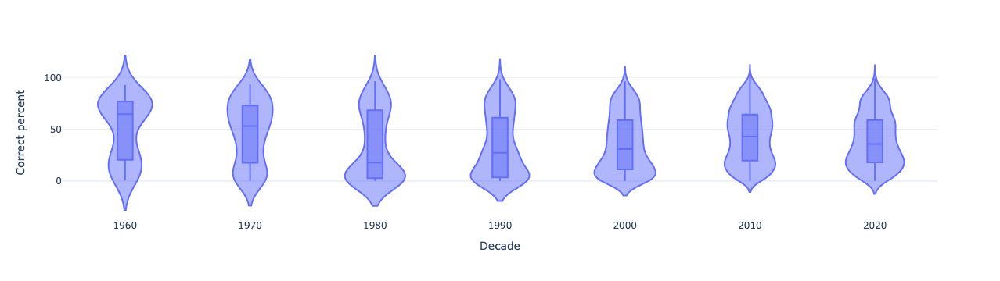

In [5]:
X['Decade'] = X['AiredDate'].dt.year//10*10 
px.violin(X, x='Decade', y='p_correctGuess', template='plotly_white', box=True, labels=lbs)

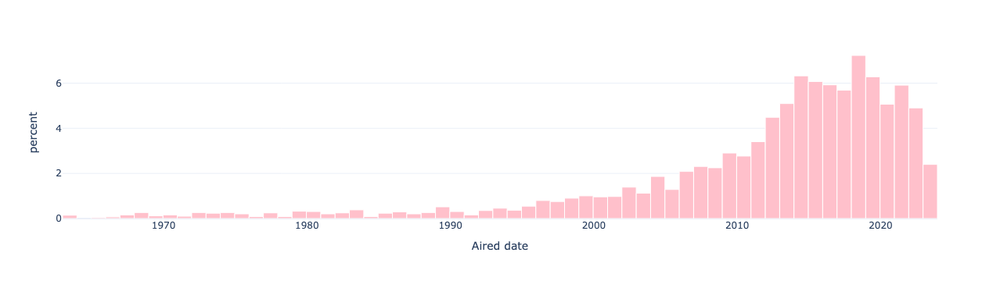

In [6]:
fig = px.histogram(X, x='AiredDate', labels=lbs, template='plotly_white', color_discrete_sequence=['pink'], histnorm='percent')
fig.update_traces(marker_line_width=1, marker_line_color="white")
fig.show()

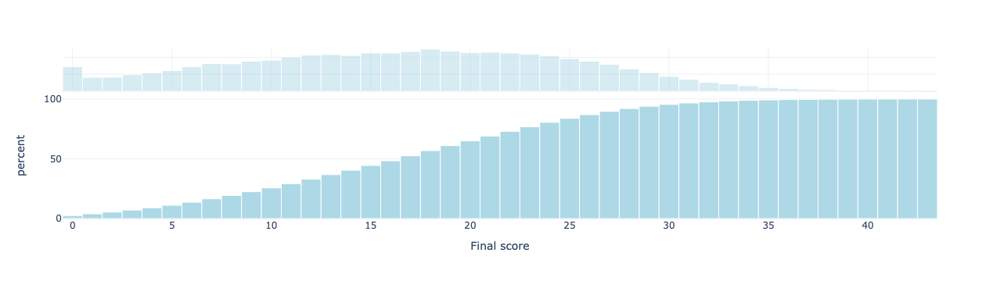

In [7]:
fig = px.histogram(
    x=finalScores,
    labels={'x':'Final score'},
    template='plotly_white',
    color_discrete_sequence=['lightblue'],
    histnorm='percent',
    cumulative=True,
    marginal='histogram'
)
fig.update_traces(marker_line_width=1, marker_line_color="white")
fig.show()

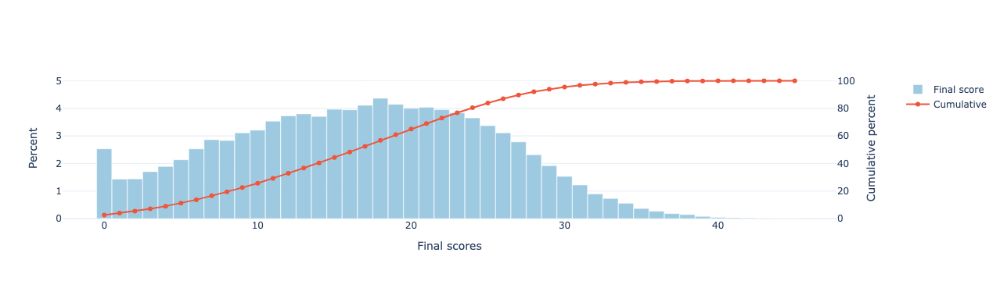

In [8]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

hist = np.histogram(finalScores, bins=np.arange(47)-0.01)[0]
hist_density = np.histogram(finalScores, bins=np.arange(47)-0.01, density=True)[0]*100
fig.add_trace(
    go.Bar(x=np.arange(0, 46), y=hist_density, name='Final score', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(158,202,225)')
fig.add_trace(
    go.Scatter(x=np.arange(0, 46), y=hist_density.cumsum() ,mode='lines+markers', name='Cumulative'),
    secondary_y=True,
)
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Percent'),
        side='left',
        range=[0, 5.1],
    ),
    yaxis2=dict(
        title=dict(text='Cumulative percent'),
        side='right',
        range=[0, 102],
        overlaying='y',
        tickmode='auto',
    ),)
fig.update_xaxes(title_text='Final scores')
fig

In [ ]:
fig = px.scatter(
    X,
    x='avgGuessTime_i',
    y='difficulty',
    template='plotly_white',
    labels=lbs,
    marginal_x='histogram',
    range_x=[2000, 20000],
    range_y=[0, 100],
    trendline='ols',
    opacity=0.5,
    hover_data=hover_dt
)
fig.show()
px.scatter(
    X,
    x='avgGuessTime',
    y='difficulty',
    template='plotly_white',
    labels=lbs,
    marginal_x='histogram',
    range_x=[2000, 20000],
    range_y=[0, 100],
    trendline='ols',
    opacity=0.5,
    hover_data=hover_dt
)

In [ ]:
px.scatter(
        X,
        x='difficulty',
        y='p_correctGuess',
        color='type_noNumber',
        marginal_x='histogram', 
        marginal_y='histogram',
        hover_data=hover_dt,
        labels=lbs,
        trendline=None,
        template='plotly_white',
        range_x=[0, 100],
        range_y=[0, 100],
        opacity=0.5
        )

In [ ]:
X.columns

In [ ]:
f, ax_p = plt.subplots()
color = 'pink'
ax_p.set_xlabel('Genres')
ax_p.set_ylabel('Count', color=color)
ax_p.bar(genres['Count'].keys().tolist(), genres['Count'], color=color)
ax_p.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=90)

ax_c = ax_p.twinx()

color = 'red'
ax_c.set_ylabel('Guess rate', color=color)
ax_c.bar(genres['Count'].keys().tolist(), genres['Guess rate'], edgecolor=color, fill=False)
ax_c.tick_params(axis='y', labelcolor=color)

f.tight_layout()
plt.savefig(r'C:\Users\imnku\Downloads\genres.png')
plt.show()


f, ax_p = plt.subplots()
color = 'pink'
ax_p.set_xlabel('Top 30 tags')
ax_p.set_ylabel('Count', color=color)
ax_p.bar(tags['Count'].keys().tolist(), tags['Count'], color=color)
ax_p.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=90)

ax_c = ax_p.twinx()

color = 'red'
ax_c.set_ylabel('Guess rate', color=color)
ax_c.bar(tags['Count'].keys().tolist(), tags['Guess rate'], edgecolor=color, fill=False)
ax_c.tick_params(axis='y', labelcolor=color)

f.tight_layout()
plt.savefig(r'C:\Users\imnku\Downloads\tags.png')
plt.show()

In [ ]:
east_ls = last_song.loc[last_song['region'] == 'East'].reset_index(drop=True)

px.line(east_ls, x='logDate', y='totalPlayers', markers=True,
        template='plotly_white',
        labels={'totalPlayers':'Number of players', 'logDate':'Date'})

In [ ]:
central_ls = last_song.loc[last_song['region'] == 'Central'].reset_index(drop=True)

px.line(central_ls, x='logDate', y='totalPlayers', markers=True,
        template='plotly_white',
        labels={'totalPlayers':'Number of players', 'index':'Game'})

In [ ]:
px.line(east_ls, x='logDate', y=east_ls['Scores'].apply(np.mean), markers=True, color='region',
        template='plotly_white',
        labels={'y':'Mean score', 'index':'Game'})

In [ ]:
px.line(central_ls, x='logDate', y=central_ls['Scores'].apply(np.mean), markers=True,
        template='plotly_white',
        labels={'y':'Mean score', 'index':'Game'})

In [ ]:
px.scatter(X, x='shortest_length', y='avgGuessTime', trendline='ols')

In [ ]:
px.scatter(X, x='difficulty', y=['p_noGuess', 'p_noGuess_15k'], trendline='ols', opacity=0.2)

In [ ]:
px.scatter(X, x='shortest_length', y='avgGuessTime_15k', trendline='ols', opacity=0.5)

In [ ]:
px.scatter(X, y='p_correctGuess', x='avgGuessTime_15k', trendline='ols')

In [ ]:
def find_gr_by_gt(players, threshold, diff):
    c_guess_rate = np.array([])
    for i, x in enumerate(players):
        if x['active'] == False:
            continue
        if 'guessTime' not in x:
            continue
        if x['guessTime'] > threshold:
            continue
        if x['guessTime'] < threshold-diff:
            continue
        if x['correct']:
            c_guess_rate = np.append(c_guess_rate, 1)
        else:
            c_guess_rate = np.append(c_guess_rate, 0)
    return c_guess_rate.mean()

In [ ]:
thresholds = [1000*x for x in range(1, 21)]
thresholds_p = [1000*x for x in range(1, 21)]
for i, t in enumerate(thresholds):
    thresholds_p[i] = pd.Series(X['players'].apply(find_gr_by_gt, args=[t, 1000]), name=f's{t}')

In [ ]:
guess_gt = pd.DataFrame(thresholds_p).transpose()

In [ ]:
m_guess_gt = guess_gt.mean(axis=0)

In [ ]:
px.line(m_guess_gt, markers=True)

In [ ]:
px.box(guess_gt)

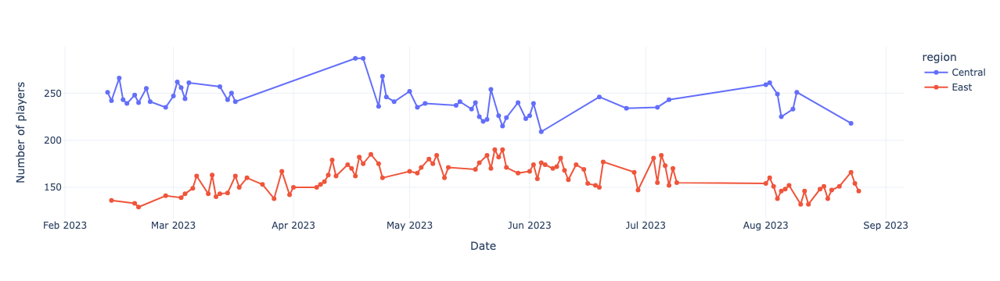

In [9]:
px.line(last_song, x='logDate', y='totalPlayers', markers=True, color='region',
        template='plotly_white',
        labels={'totalPlayers':'Number of players', 'logDate':'Date'})

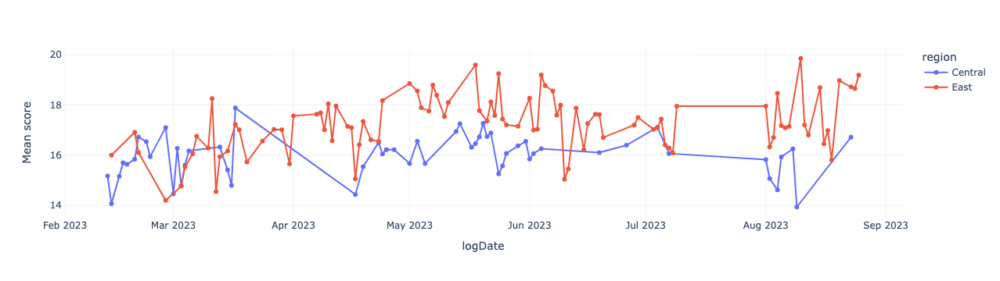

In [10]:
px.line(last_song, x='logDate', y=last_song['Scores'].apply(np.mean), markers=True, color='region',
        template='plotly_white',
        labels={'y':'Mean score', 'index':'Game'})

In [ ]:
novice.info()

In [4]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6750 entries, 0 to 6749
Columns: 331 entries, name to Thriller
dtypes: datetime64[ns](2), float64(13), int64(306), object(10)
memory usage: 17.0+ MB


In [5]:
from memory_profiler import profile

In [6]:
@profile
def load_data():
    path_central_novice = './CentralR-N'
    all_files_central_novice = sorted(glob.glob(os.path.join(path_central_novice, "*.json")))

    central = []
    for f in all_files_central_novice:
        df = pd.read_json(f)
        df['logDate'] = f[25:35]
        df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
        central.append(df)
        
    central_novice = pd.concat(central, ignore_index=True)
    central_novice['region'] = 'Central'

    path_east_novice = './EastR-N'
    all_files_east_novice = sorted(glob.glob(os.path.join(path_east_novice, "*.json")))

    east = []
    for f in all_files_east_novice:
        df = pd.read_json(f)
        df['logDate'] = f[22:32]
        df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
        east.append(df)
        
    east_novice = pd.concat(east, ignore_index=True)
    east_novice['region'] = 'East'

    novice = pd.concat(([central_novice, east_novice]), ignore_index=True)
    X = novice.drop(['annId', 'urls', 'siteIds', 'animeScore', 'selfAnswer', 'fromList', 'gameMode', 'correct'], axis=1)
    return X

In [7]:
!python -m memory_profiler

A program to run must be provided. Use -h for help
